Autor: William Liaw ([@willfliaw](https://github.com/willfliaw), NUSP: 11834011).

Relatório acadêmico apresentado à Escola Politécnica da Universidade de São Paulo como atividade da Disciplina Introdução à Ciência de Dados para Engenheiros (PME3573).

Este documento é componente da atividade [E01 - Fluxo de Informação e Análise Visual de Dados](https://github.com/willfliaw/PME3573/tree/main/E01), do repositório [PME3573](https://github.com/willfliaw/PME3573/). Recomenda-se a leitura dos arquivos `README.md` do repositório, e `README.md` específico da atividade, para melhor noção do contexto em que se insere este trabalho acadêmico, dentre outros detalhes preliminares. Além disso, **recomenda-se fortemente** a leitura deste documento em sua versão `.ipynb`, no [GitHub](https://github.com/willfliaw/PME3573/blob/main/E01/E01-William%20Liaw.ipynb), uma vez que lá é possível visualizar em melhor definição as tabelas e gráficos. Ainda assim, vale frisar que todos os gráficos gerados encontram-se disponíveis no diretório [`images`](https://github.com/willfliaw/PME3573/tree/main/E01/images).

Nas seções seguintes, pode-se examinar o código utilizado para a tabulação dos dados, e, ao final, tem-se as constatações passíveis de serem feitas a partir das diversas visualizações.

# Dados experimentais

Os bancos de dados a serem analisados no presente Relatório podem ser encontrados em [Dados Abertos | Governo do Estado de São Paulo](https://www.saopaulo.sp.gov.br/planosp/simi/dados-abertos/).

### Casos e óbitos por município e data

Registro de casos e óbitos por município e data de notificação no Estado de São Paulo.

| Arquivo                                         | Descrição                                             |
|:-----------------------------------------------:|:-----------------------------------------------------:|
| `./data/20230418_Casos-e-obitos-ESP.csv`        | `./metadata/Dic.-dados_dados_covid_municipios_sp.pdf` |

Ao longo deste trabalho, apelidará-se este banco de dados de **COMuDa**.

### Microdados dos casos

Base de dados com registros individualizados e anonimizados, detalhados com os seguintes campos: Notificações, Evolução, Confirmação do caso para COVID-19, Idade, Gênero, Doenças Preexistentes, Sintomas, Raça/Cor, Etnia, Município, Profissionais de Saúde.

| Arquivo                                         | Descrição                             |
|:-----------------------------------------------:|:-------------------------------------:|
| `./data/20230418_dados_covid_municipios_sp.csv` | `./metadata/Dic-dados_microdados.pdf` |

Ao longo deste trabalho, apelidará-se este banco de dados de **MiCa**.

# Configurações de ambiente

## Estrutura do diretório

Antes de executar quaisquer células de código, a estrutura do diretório é como a seguir:

```
E01/
├── data/
│   ├── 20230418_Casos_e_obitos_ESP.csv
│   └── 20230418_dados_covid_municipios_sp-1.csv
├── images/
├── metadata/
│   ├── Dic-dados_microdados.pdf
│   └── Dic.-dados_dados_covid_municipios_sp.pdf
├── E01 - Fluxo de Informação e Análise Visual de Dados.pdf
├── E01-William Liaw.ipynb
├── E01-William Liaw.pdf
└── README.md
```

## Importando bibliotecas

In [1]:
import sqlite3

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

%matplotlib inline

plt.rcParams["figure.dpi"] = 120

# Limpeza de dados

Esta seção de Limpeza de dados, após executada por completo uma única vez, torna-se desnecessária para demais execuções. Por conseguinte, após executá-la uma vez, podem-se executar as seções seguintes no intuito de otimizar os recursos (tempo, memória, energia) consumidos.

## COMuDa

In [2]:
dataCOMuDa = pd.read_csv("./data/20230418_dados_covid_municipios_sp-1.csv", sep = ";", decimal = ",", parse_dates = ["datahora"])

In [3]:
dataCOMuDa["nome_munic"] = dataCOMuDa["nome_munic"].replace("Ignorado", np.NaN)
dataCOMuDa["codigo_ibge"] = dataCOMuDa["codigo_ibge"].replace(9999999, np.NaN).astype("Int64")

In [4]:
dataCOMuDa.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 741608 entries, 0 to 741607
Data columns (total 11 columns):
 #   Column         Non-Null Count   Dtype         
---  ------         --------------   -----         
 0   nome_munic     740460 non-null  object        
 1   codigo_ibge    740460 non-null  Int64         
 2   datahora       741608 non-null  datetime64[ns]
 3   casos          741608 non-null  int64         
 4   casos_novos    741608 non-null  int64         
 5   casos_mm7d     741608 non-null  float64       
 6   obitos         741608 non-null  int64         
 7   obitos_novos   741608 non-null  int64         
 8   obitos_mm7d    741608 non-null  float64       
 9   pop            741608 non-null  int64         
 10  semana_epidem  741608 non-null  int64         
dtypes: Int64(1), datetime64[ns](1), float64(2), int64(6), object(1)
memory usage: 62.9+ MB


Constata-se que os dados já se encontram no formato *tidy*.

Nota-se que, por mais que na descrição de COMuDa estejam presentes a descrição de 31 atributos diferentes, tem-se no arquivo `csv` apenas 11 atributos diferentes: 

| Coluna          | Atributo                                        |
|-----------------|:-----------------------------------------------:|
| `nome_munic`    | Nome do município                               |
| `codigo_ibge`   | Código do município no IBGE (7 dígitos)         |
| `datahora`      | Data no formato YYYY-MM-DD                      |
| `casos`         | Casos totais registrados até a data             |
| `casos_novos`   | Casos novos registrados na data                 |
| `casos_mm7d`    | Média móvel dos últimos 7 dias dos novos casos  |
| `obitos`        | Óbitos totais registrados até a data            |
| `obitos_novos`  | Óbitos novos registrados na data                |
| `obitos_mm7d`   | Média móvel dos últimos 7 dias dos novos óbitos |
| `pop`           | População Estimada (fonte SEADE)                |
| `semana_epidem` | Semana Epidemológica                            |

In [5]:
dataCOMuDa.describe()

,codigo_ibge,datahora,casos,casos_novos,casos_mm7d,obitos,obitos_novos,obitos_mm7d,pop,semana_epidem
count,740460.0,741608,7.416080e+05,741608.000000,741608.000000,741608.000000,741608.000000,741608.000000,7.416080e+05,741608.000000
mean,3528697.88062,2021-09-20 12:00:00.000000512,5.611959e+03,8.848645,8.840583,174.616328,0.242406,0.242335,6.910201e+04,26.054878
min,3500105.0,2020-02-25 00:00:00,-1.000000e+00,-3064.000000,-591.142857,0.000000,-81.000000,-11.571429,0.000000e+00,1.000000
25%,3514601.0,2020-12-07 18:00:00,2.160000e+02,0.000000,0.000000,5.000000,0.000000,0.000000,5.530000e+03,13.000000
50%,3528700.0,2021-09-20 12:00:00,8.810000e+02,0.000000,0.571429,22.000000,0.000000,0.000000,1.328300e+04,25.500000
75%,3543204.0,2022-07-04 06:00:00,3.284000e+03,2.000000,4.000000,80.000000,0.000000,0.142857,4.107300e+04,39.000000
max,3557303.0,2023-04-17 00:00:00,1.162991e+06,8646.000000,4706.285714,44781.000000,378.000000,226.000000,1.186966e+07,53.000000
std,16687.388401,NaN,3.524673e+04,70.027598,59.791699,1365.383662,2.823989,2.368140,4.794512e+05,15.071487


In [6]:
dataCOMuDa.describe(include = object)

,nome_munic
count,740460
unique,645
top,Adamantina
freq,1148


Como as colunas `nome_munic` e `codigo_ibge` são redundantes, pode-se excluir uma delas do banco de dados. Caso seja necessário recuperar as informações excluídas, pode-se simplesmente utilizar um dicionário. Aqui, optou-se por excluir a coluna `codigo_ibge`:

In [7]:
codigoIBGE = dict()

for munic, codigo in zip(dataCOMuDa["nome_munic"].unique(), dataCOMuDa["codigo_ibge"].unique()):
  codigoIBGE[munic] = codigo

np.save("./data/codigoIBGE.npy", codigoIBGE) 

In [8]:
dataCOMuDa = dataCOMuDa.drop("codigo_ibge", axis = 1)

Para a releitura do arquivo referente ao dicionário, basta executar: 
```Python
codigoIBGE = np.load("./data/codigoIBGE.npy", allow_pickle = "TRUE").item()
```

In [9]:
print(list(dataCOMuDa["nome_munic"].value_counts().unique())[0])

1148


Nota-se, pelas célula acima, que todos os $ 645 $ municípios diferentes apresentam $ 1148 $ ocorrências.

As colunas `casos_novos` e `casos_mm7d` podem ser extraídas da coluna `casos` e, consequentemente, são redundantes e podem ser removidas. Similarmente, as colunas `obitos_novos` e `obitos_mm7d` podem ser extraídas da coluna `obitos` e, consequentemente, também são redundantes e podem ser removidas.

In [10]:
dataCOMuDa = dataCOMuDa.drop(["casos_novos", "casos_mm7d", "obitos_novos", "obitos_mm7d"], axis = 1)

Observa-se, então, que o banco de dados resultante é consideravelmente mais simples de ser analisado, e não apresenta perda de generalidade:

In [11]:
dataCOMuDa.head(10)

,nome_munic,datahora,casos,obitos,pop,semana_epidem
0,Adamantina,2020-02-25,0,0,33894,9
1,Adolfo,2020-02-25,0,0,3447,9
2,Aguaí,2020-02-25,0,0,35608,9
3,Águas da Prata,2020-02-25,0,0,7797,9
4,Águas de Lindóia,2020-02-25,0,0,18374,9
5,Águas de Santa Bárbara,2020-02-25,0,0,5931,9
6,Águas de São Pedro,2020-02-25,0,0,3122,9
7,Agudos,2020-02-25,0,0,36134,9
8,Alambari,2020-02-25,0,0,5779,9
9,Alfredo Marcondes,2020-02-25,0,0,3927,9


Para a persistência do banco de dados limpo, exporta-se o banco de dados resultante em um arquivo `.db`:

In [12]:
conn = sqlite3.connect("data/COMuDa.db")
cursor = conn.cursor()

dataCOMuDa.to_sql("COMuDa", con = conn, if_exists = "replace", index = False)

741608

Para ler todo o arquivo `SQL` novamente em um `DataFrame`, basta realizar:

```Python
conn = sqlite3.connect("data/COMuDa.db")
cursor = conn.cursor()
cursor.execute("SELECT * FROM COMuDa")
dataCOMuDa = pd.DataFrame(cursor.fetchall(), columns = ["nome_munic", "datahora", "casos", "obitos", "pop", "semana_epidem"])
dataCOMuDa["datahora"] = pd.to_datetime(dataCOMuDa["datahora"])
dataCOMuDa = dataCOMuDa.fillna(value = np.NaN)
```

## MiCa

In [13]:
dataMiCa = pd.read_csv("./data/20230418_Casos_e_obitos_ESP.csv", sep = ";", parse_dates = ["Data_Inicio_Sintomas"], dayfirst = True)

In [14]:
dataMiCa = dataMiCa.replace("IGNORADO", np.NaN)
dataMiCa["Obito"] = dataMiCa["Obito"].replace({1: "SIM", 0: "NÃO"})
dataMiCa["Idade"] = dataMiCa["Idade"].astype("Int64")

In [15]:
dataMiCa.info(show_counts = True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6564440 entries, 0 to 6564439
Data columns (total 19 columns):
 #   Column                   Non-Null Count    Dtype         
---  ------                   --------------    -----         
 0   Asma                     231334 non-null   object        
 1   Cardiopatia              564058 non-null   object        
 2   Data_Inicio_Sintomas     6336584 non-null  datetime64[ns]
 3   Diabetes                 449179 non-null   object        
 4   Diagnostico_Covid19      6564440 non-null  object        
 5   Doenca_Hematologica      227770 non-null   object        
 6   Doenca_Hepatica          226996 non-null   object        
 7   Doenca_Neurologica       234349 non-null   object        
 8   Doenca Renal             244003 non-null   object        
 9   Genero                   6564430 non-null  object        
 10  Idade                    6359994 non-null  Int64         
 11  Imunodepressao           254127 non-null   object        
 12  

Constata-se que os dados já se encontram no formato *tidy*. Constata-se, ainda, que os dados são desbalanceados: tem-se certos atributos (exemplo: `Data_Inicio_Sintomas`) com mais instâncias que outros (exemplo: `Puérpera`). Tal desbalanceamento deverá ser eventualmente lidado, caso seja de interesse, por exemplo, introduzir o banco de dados a um algoritmo de Aprendizagem de Máquina.

In [16]:
dataMiCa.describe()

,Data_Inicio_Sintomas,Idade
count,6336584,6359994.0
mean,2021-06-12 12:41:18.289752832,41.008249
min,2020-02-04 00:00:00,0.0
25%,2020-12-27 00:00:00,28.0
50%,2021-05-03 00:00:00,40.0
75%,2022-01-11 00:00:00,53.0
max,2023-04-17 00:00:00,2188.0
std,NaN,18.404121


Nota-se que tem-se idades mínimas impossivelmente baixas (mínima de $0.0$) e altas (máxima de $2188.0$). Aqui, considera-se como erro idades acima de 100 anos e abaixo de 1 ano.

In [17]:
dataMiCa.loc[dataMiCa["Idade"] > 100, "Idade"] = np.NaN
dataMiCa.loc[dataMiCa["Idade"] < 1, "Idade"] = np.NaN

In [18]:
dataMiCa.describe(include = object)

,Asma,Cardiopatia,Diabetes,Diagnostico_Covid19,Doenca_Hematologica,Doenca_Hepatica,Doenca_Neurologica,Doenca Renal,Genero,Imunodepressao,Municipio,Obesidade,Obito,Outros_Fatores_De_Risco,Pneumopatia,Puérpera,Síndrome_De_Down
count,231334,564058,449179,6564440,227770,226996,234349,244003,6564430,254127,6564440,238301,6564440,277036,233630,225864,227349
unique,2,2,2,1,2,2,2,2,3,2,646,2,2,2,2,2,2
top,NÃO,SIM,SIM,CONFIRMADO,NÃO,NÃO,NÃO,NÃO,FEMININO,NÃO,SÃO PAULO,NÃO,NÃO,SIM,NÃO,NÃO,NÃO
freq,215352,463934,308626,6564440,223313,222345,210814,212338,3587995,215896,1163594,189832,6384650,151353,213806,224196,225912


In [19]:
dataMiCa.head(10)

,Asma,Cardiopatia,Data_Inicio_Sintomas,Diabetes,Diagnostico_Covid19,Doenca_Hematologica,Doenca_Hepatica,Doenca_Neurologica,Doenca Renal,Genero,Idade,Imunodepressao,Municipio,Obesidade,Obito,Outros_Fatores_De_Risco,Pneumopatia,Puérpera,Síndrome_De_Down
0,NaN,NaN,2022-07-15,NaN,CONFIRMADO,NaN,NaN,NaN,NaN,MASCULINO,69,NaN,ASSIS,NaN,NÃO,NaN,NaN,NaN,NaN
1,NaN,NaN,2021-02-21,NaN,CONFIRMADO,NaN,NaN,NaN,NaN,FEMININO,60,NaN,SÃO PAULO,NaN,NÃO,NaN,NaN,NaN,NaN
2,NaN,NaN,2021-06-23,NaN,CONFIRMADO,NaN,NaN,NaN,NaN,MASCULINO,58,NaN,ARARAQUARA,NaN,NÃO,NaN,NaN,NaN,NaN
3,NaN,NaN,2021-02-03,NaN,CONFIRMADO,NaN,NaN,NaN,NaN,FEMININO,45,NaN,SÃO PAULO,NaN,NÃO,NaN,NaN,NaN,NaN
4,NaN,NaN,2021-02-23,NaN,CONFIRMADO,NaN,NaN,NaN,NaN,FEMININO,42,NaN,SÃO PAULO,NaN,NÃO,NaN,NaN,NaN,NaN
5,NaN,NaN,2021-02-24,NaN,CONFIRMADO,NaN,NaN,NaN,NaN,FEMININO,33,NaN,SÃO PAULO,NaN,NÃO,NaN,NaN,NaN,NaN
6,NaN,NaN,2022-01-20,NaN,CONFIRMADO,NaN,NaN,NaN,NaN,MASCULINO,32,NaN,CAMPINAS,NaN,NÃO,NaN,NaN,NaN,NaN
7,NaN,NaN,2021-02-22,NaN,CONFIRMADO,NaN,NaN,NaN,NaN,FEMININO,27,NaN,SÃO PAULO,NaN,NÃO,NaN,NaN,NaN,NaN
8,NaN,NaN,2022-05-02,NaN,CONFIRMADO,NaN,NaN,NaN,NaN,MASCULINO,1,NaN,CAMPINAS,NaN,NÃO,NaN,NaN,NaN,NaN
9,NaN,NaN,2021-05-15,NaN,CONFIRMADO,NaN,NaN,NaN,NaN,MASCULINO,35,NaN,MAUÁ,NaN,NÃO,NaN,NaN,NaN,NaN


Para a persistência do banco de dados limpo, exporta-se o banco de dados resultante em um arquivo `.db`:

In [20]:
conn = sqlite3.connect("data/MiCa.db")
cursor = conn.cursor()

dataMiCa.to_sql("MiCa", con = conn, if_exists = "replace", index = False)

6564440

Para ler todo o arquivo `SQL` novamente em um `DataFrame`, basta realizar:

```Python
conn = sqlite3.connect("data/MiCa.db")
cursor = conn.cursor()
cursor.execute("SELECT * FROM MiCa")
dataMiCa = pd.DataFrame(cursor.fetchall(), columns = ["Asma", "Cardiopatia", "Data_Inicio_Sintomas", "Diabetes", "Diagnostico_Covid19", "Doenca_Hematologica", "Doenca_Hepatica", "Doenca_Neurologica", "Doenca Renal", "Genero", "Idade", "Imunodepressao", "Municipio", "Obesidade", "Obito", "Outros_Fatores_De_Risco", "Pneumopatia", "Puérpera", "Síndrome_De_Down"])
dataMiCa["Data_Inicio_Sintomas"] = pd.to_datetime(dataMiCa["Data_Inicio_Sintomas"])
dataMiCa = dataMiCa.fillna(value = np.NaN)
```

# Análise de dados

## Relendo os bancos de dados

Aqui, lê-se os bancos de dados inteiros, pois todos os dados serão analisados.

In [21]:
conn = sqlite3.connect("data/COMuDa.db")
cursor = conn.cursor()
cursor.execute("SELECT * FROM COMuDa")
dataCOMuDa = pd.DataFrame(cursor.fetchall(), columns = ["nome_munic", "datahora", "casos", "obitos", "pop", "semana_epidem"])
dataCOMuDa["datahora"] = pd.to_datetime(dataCOMuDa["datahora"])
dataCOMuDa = dataCOMuDa.fillna(value = np.NaN)

In [22]:
dataCOMuDa.head(5)

,nome_munic,datahora,casos,obitos,pop,semana_epidem
0,Adamantina,2020-02-25,0,0,33894,9
1,Adolfo,2020-02-25,0,0,3447,9
2,Aguaí,2020-02-25,0,0,35608,9
3,Águas da Prata,2020-02-25,0,0,7797,9
4,Águas de Lindóia,2020-02-25,0,0,18374,9


Na célula abaixo, filtra-se COMuDa, removendo as instâncias sem município definido.

In [23]:
dataCOMuDaClean = dataCOMuDa[dataCOMuDa["nome_munic"].notna()]

In [24]:
conn = sqlite3.connect("data/MiCa.db")
cursor = conn.cursor()
cursor.execute("SELECT * FROM MiCa")
dataMiCa = pd.DataFrame(cursor.fetchall(), columns = ["Asma", "Cardiopatia", "Data_Inicio_Sintomas", "Diabetes", "Diagnostico_Covid19", "Doenca_Hematologica", "Doenca_Hepatica", "Doenca_Neurologica", "Doenca Renal", "Genero", "Idade", "Imunodepressao", "Municipio", "Obesidade", "Obito", "Outros_Fatores_De_Risco", "Pneumopatia", "Puérpera", "Síndrome_De_Down"])
dataMiCa["Data_Inicio_Sintomas"] = pd.to_datetime(dataMiCa["Data_Inicio_Sintomas"])
dataMiCa = dataMiCa.fillna(value = np.NaN)

In [25]:
dataMiCa.head(5)

,Asma,Cardiopatia,Data_Inicio_Sintomas,Diabetes,Diagnostico_Covid19,Doenca_Hematologica,Doenca_Hepatica,Doenca_Neurologica,Doenca Renal,Genero,Idade,Imunodepressao,Municipio,Obesidade,Obito,Outros_Fatores_De_Risco,Pneumopatia,Puérpera,Síndrome_De_Down
0,NaN,NaN,2022-07-15,NaN,CONFIRMADO,NaN,NaN,NaN,NaN,MASCULINO,69.0,NaN,ASSIS,NaN,NÃO,NaN,NaN,NaN,NaN
1,NaN,NaN,2021-02-21,NaN,CONFIRMADO,NaN,NaN,NaN,NaN,FEMININO,60.0,NaN,SÃO PAULO,NaN,NÃO,NaN,NaN,NaN,NaN
2,NaN,NaN,2021-06-23,NaN,CONFIRMADO,NaN,NaN,NaN,NaN,MASCULINO,58.0,NaN,ARARAQUARA,NaN,NÃO,NaN,NaN,NaN,NaN
3,NaN,NaN,2021-02-03,NaN,CONFIRMADO,NaN,NaN,NaN,NaN,FEMININO,45.0,NaN,SÃO PAULO,NaN,NÃO,NaN,NaN,NaN,NaN
4,NaN,NaN,2021-02-23,NaN,CONFIRMADO,NaN,NaN,NaN,NaN,FEMININO,42.0,NaN,SÃO PAULO,NaN,NÃO,NaN,NaN,NaN,NaN


## Número total de casos e óbitos por Covid-19 no Estado de São Paulo

A célula abaixo cria um único *dataFrame*, dataSP, para todos os municípios nomeados de COMuDa (o que exclui as instâncias sem municípios especificados), aglutinando as informações presentes nas colunas referentes aos casos, óbitos, população e semana epidemiológica.

In [26]:
dataSP = []

for date in dataCOMuDa["datahora"].unique():
  dataDate = dataCOMuDaClean[dataCOMuDaClean["datahora"] == date]
  dataSP.append(pd.concat([dataDate[["casos", "obitos", "pop"]].sum(), pd.Series({"datahora": date, "semana_epidem": dataDate["semana_epidem"].iloc[0]})]))

dataSP = pd.DataFrame(dataSP)

In [27]:
dataSP.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1148 entries, 0 to 1147
Data columns (total 5 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   casos          1148 non-null   int64         
 1   obitos         1148 non-null   int64         
 2   pop            1148 non-null   int64         
 3   datahora       1148 non-null   datetime64[ns]
 4   semana_epidem  1148 non-null   int64         
dtypes: datetime64[ns](1), int64(4)
memory usage: 45.0 KB


In [28]:
dataSP.head(5)

,casos,obitos,pop,datahora,semana_epidem
0,1,0,44639899,2020-02-25,9
1,1,0,44639899,2020-02-26,9
2,1,0,44639899,2020-02-27,9
3,2,0,44639899,2020-02-28,9
4,2,0,44639899,2020-02-29,9


Pode-se observar a instância resultante de maior data:

In [29]:
dataSP.loc[dataSP["datahora"].idxmax()]

casos                        6561957
obitos                        179770
pop                         44639899
datahora         2023-04-17 00:00:00
semana_epidem                     16
Name: 1147, dtype: object

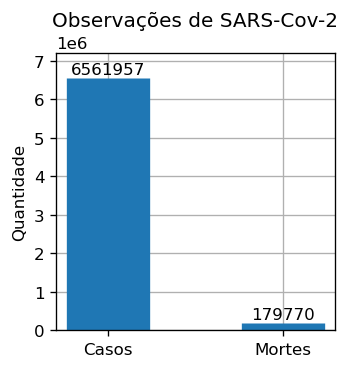

In [30]:
fig, ax = plt.subplots(figsize = (3, 3))

ax.vlines(x = 0, ymin = 0, ymax = dataSP.loc[dataSP["datahora"].idxmax()]["casos"], linewidth = 50)
ax.vlines(x = 1, ymin = 0, ymax = dataSP.loc[dataSP["datahora"].idxmax()]["obitos"], linewidth = 50)

ax.text(0, dataSP.loc[dataSP["datahora"].idxmax()]["casos"] + 1e5, dataSP.loc[dataSP["datahora"].idxmax()]["casos"], horizontalalignment = "center")
ax.text(1, dataSP.loc[dataSP["datahora"].idxmax()]["obitos"] + 1e5, dataSP.loc[dataSP["datahora"].idxmax()]["obitos"], horizontalalignment = "center")

ax.set_title("Observações de SARS-Cov-2")

ax.set(ylim = (0, 7.2e6), xlim = (-0.3, 1.3))
ax.set_ylabel("Quantidade")
plt.xticks([0, 1], ["Casos", "Mortes"])

plt.grid()

plt.savefig("./images/Observações de SARS-Cov-2.png")

plt.show()

## Evolução do número total de casos e óbitos

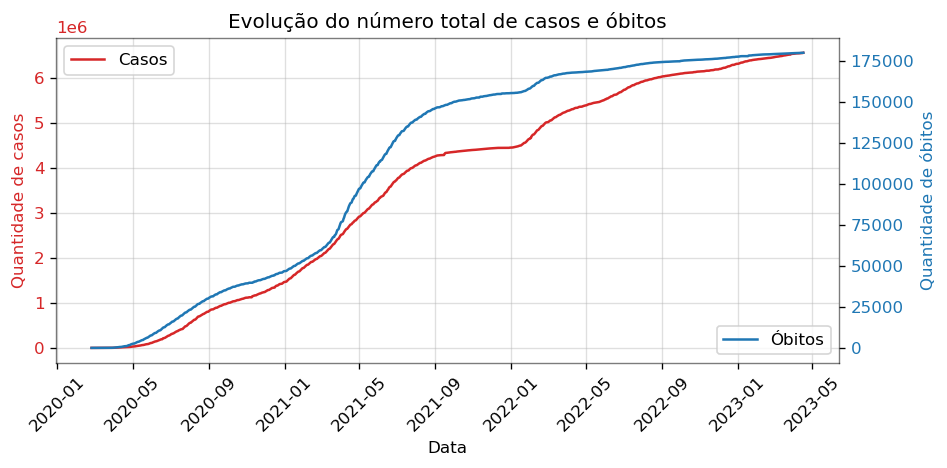

In [31]:
x = dataSP["datahora"]
y1 = dataSP["casos"]
y2 = dataSP["obitos"]

fig, ax1 = plt.subplots(1, 1, figsize = (8, 4))
ax1.plot(x, y1, color = "tab:red", label = "Casos")

ax2 = ax1.twinx()
ax2.plot(x, y2, color = "tab:blue", label = "Óbitos")

ax1.set_xlabel("Data")
ax1.tick_params(axis = "x", rotation = 45)
ax1.set_ylabel("Quantidade de casos", color = "tab:red")
ax1.tick_params(axis = "y", labelcolor = "tab:red")
ax1.grid(alpha = .4)
ax1.legend(loc = "upper left")

ax1.spines["top"].set_alpha(0.3)
ax1.spines["bottom"].set_alpha(0.3)
ax1.spines["right"].set_alpha(0.3)
ax1.spines["left"].set_alpha(0.3)

ax2.set_ylabel("Quantidade de óbitos", color = "tab:blue")
ax2.tick_params(axis = "y", labelcolor = "tab:blue")
ax2.set_title("Evolução do número total de casos e óbitos")
ax2.legend(loc = "lower right")

ax2.spines["top"].set_alpha(0.3)
ax2.spines["bottom"].set_alpha(0.3)
ax2.spines["right"].set_alpha(0.3)
ax2.spines["left"].set_alpha(0.3)

fig.tight_layout()

plt.savefig("./images/Evolução do número total de casos e óbitos.png")

plt.show()

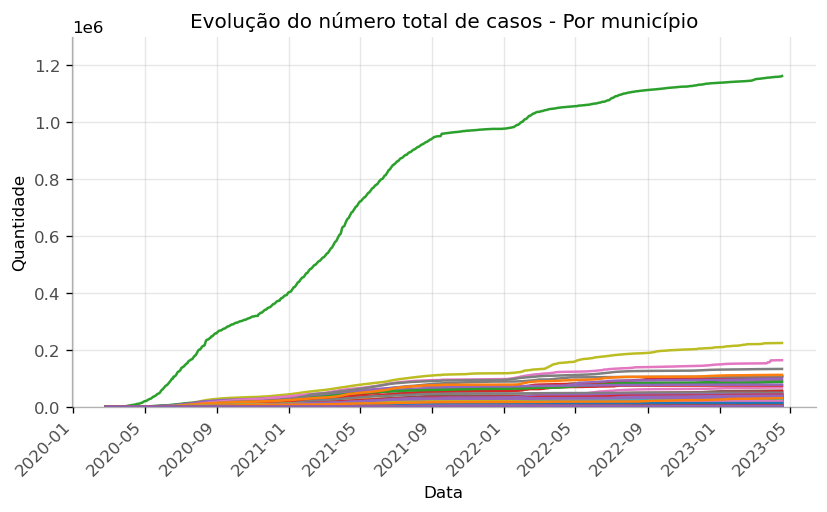

In [32]:
plt.figure(figsize = (8, 4))

for munic in dataCOMuDaClean["nome_munic"].unique():
  plt.plot("datahora", "casos", data = dataCOMuDaClean[dataCOMuDaClean["nome_munic"] == munic])

plt.ylim(0, 1.3e6)
plt.xticks(rotation = 45, horizontalalignment = "right", alpha = .7)
plt.yticks(alpha = .7)

plt.title("Evolução do número total de casos - Por município")
plt.xlabel("Data")
plt.ylabel("Quantidade")

plt.grid(axis = "both", alpha = .3)
plt.gca().spines["top"].set_alpha(0.0)
plt.gca().spines["bottom"].set_alpha(0.3)
plt.gca().spines["right"].set_alpha(0.0)
plt.gca().spines["left"].set_alpha(0.3)

plt.savefig("./images/Evolução do número total de casos - Por município.png")

plt.show()

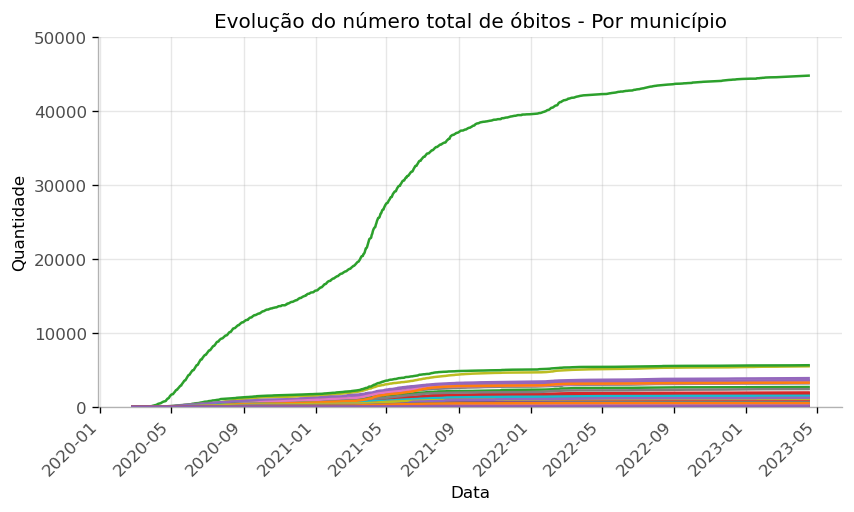

In [33]:
plt.figure(figsize = (8, 4))

for munic in dataCOMuDaClean["nome_munic"].unique():
  plt.plot("datahora", "obitos", data = dataCOMuDaClean[dataCOMuDaClean["nome_munic"] == munic])

plt.ylim(0, 5e4)
plt.xticks(rotation = 45, horizontalalignment = "right", alpha = .7)
plt.yticks(alpha = .7)

plt.title("Evolução do número total de óbitos - Por município")
plt.xlabel("Data")
plt.ylabel("Quantidade")

plt.grid(axis = "both", alpha = .3)
plt.gca().spines["top"].set_alpha(0.0)
plt.gca().spines["bottom"].set_alpha(0.3)
plt.gca().spines["right"].set_alpha(0.0)
plt.gca().spines["left"].set_alpha(0.3)

plt.savefig("./images/Evolução do número total de óbitos - Por município.png")

plt.show()

In [34]:
dataCOMuDaClean.loc[dataCOMuDaClean["casos"].idxmax()]

nome_munic                 São Paulo
datahora         2023-04-17 00:00:00
casos                        1162991
obitos                         44781
pop                         11869660
semana_epidem                     16
Name: 740377, dtype: object

In [35]:
dataCOMuDaClean.loc[dataCOMuDaClean["obitos"].idxmax()]

nome_munic                 São Paulo
datahora         2023-04-17 00:00:00
casos                        1162991
obitos                         44781
pop                         11869660
semana_epidem                     16
Name: 740377, dtype: object

Nota-se que o município de São Paulo é preponderante para casos e para óbitos.

Como não se extraem informações novas dos gráficos tabulados por municípios, não se desenha este gráfico nas outras instâncias.

## Evolução do número de novos casos e óbitos - MM 7 dias

In [36]:
dataSP["casos_mm7d"] = dataSP["casos"].rolling(7).mean()
dataSP["obitos_mm7d"] = dataSP["obitos"].rolling(7).mean()

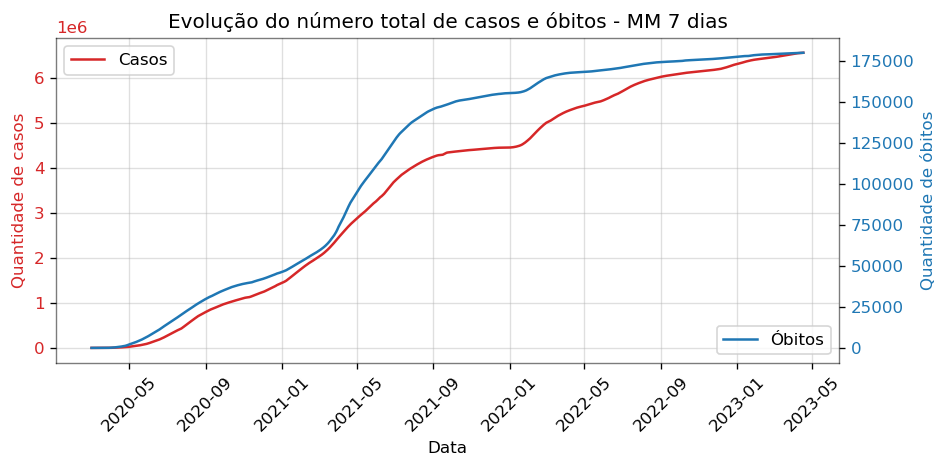

In [37]:
x = dataSP["datahora"]
y1 = dataSP["casos_mm7d"]
y2 = dataSP["obitos_mm7d"]

fig, ax1 = plt.subplots(1, 1, figsize = (8, 4))
ax1.plot(x, y1, color = "tab:red", label = "Casos")

ax2 = ax1.twinx()
ax2.plot(x, y2, color = "tab:blue", label = "Óbitos")

ax1.set_xlabel("Data")
ax1.tick_params(axis = "x", rotation = 45)
ax1.set_ylabel("Quantidade de casos", color = "tab:red")
ax1.tick_params(axis = "y", labelcolor = "tab:red")
ax1.grid(alpha = .4)
ax1.legend(loc = "upper left")

ax1.spines["top"].set_alpha(0.3)
ax1.spines["bottom"].set_alpha(0.3)
ax1.spines["right"].set_alpha(0.3)
ax1.spines["left"].set_alpha(0.3)

ax2.set_ylabel("Quantidade de óbitos", color = "tab:blue")
ax2.tick_params(axis = "y", labelcolor = "tab:blue")
ax2.set_title("Evolução do número total de casos e óbitos - MM 7 dias")
ax2.legend(loc = "lower right")

ax2.spines["top"].set_alpha(0.3)
ax2.spines["bottom"].set_alpha(0.3)
ax2.spines["right"].set_alpha(0.3)
ax2.spines["left"].set_alpha(0.3)

fig.tight_layout()

plt.savefig("./images/Evolução do número total de casos e óbitos - MM 7 dias.png")

plt.show()

## Evolução do número de novos casos e óbitos - MM 30 dias

In [38]:
dataSP["casos_mm30d"] = dataSP["casos"].rolling(30).mean()
dataSP["obitos_mm30d"] = dataSP["obitos"].rolling(30).mean()

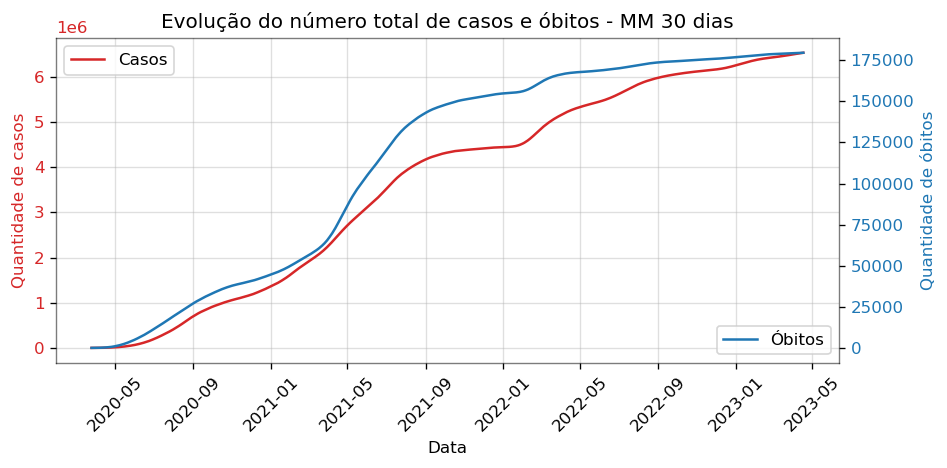

In [39]:
x = dataSP["datahora"]
y1 = dataSP["casos_mm30d"]
y2 = dataSP["obitos_mm30d"]

fig, ax1 = plt.subplots(1, 1, figsize = (8, 4))
ax1.plot(x, y1, color = "tab:red", label = "Casos")

ax2 = ax1.twinx()
ax2.plot(x, y2, color = "tab:blue", label = "Óbitos")

ax1.set_xlabel("Data")
ax1.tick_params(axis = "x", rotation = 45)
ax1.set_ylabel("Quantidade de casos", color = "tab:red")
ax1.tick_params(axis = "y", labelcolor = "tab:red")
ax1.grid(alpha = .4)
ax1.legend(loc = "upper left")

ax1.spines["top"].set_alpha(0.3)
ax1.spines["bottom"].set_alpha(0.3)
ax1.spines["right"].set_alpha(0.3)
ax1.spines["left"].set_alpha(0.3)

ax2.set_ylabel("Quantidade de óbitos", color = "tab:blue")
ax2.tick_params(axis = "y", labelcolor = "tab:blue")
ax2.set_title("Evolução do número total de casos e óbitos - MM 30 dias")
ax2.legend(loc = "lower right")

ax2.spines["top"].set_alpha(0.3)
ax2.spines["bottom"].set_alpha(0.3)
ax2.spines["right"].set_alpha(0.3)
ax2.spines["left"].set_alpha(0.3)

fig.tight_layout()

plt.savefig("./images/Evolução do número total de casos e óbitos - MM 30 dias.png")

plt.show()

## Número total de casos e óbitos por município

A célula abaixo cria um *dataFrame*, com informações referentes aos casos (absolutos e per capita), óbitos (absolutos e per capita) e população, na última data registrada, para cada município de COMuDa.

In [40]:
municsTotalCasesDeaths = dict()

for munic in dataCOMuDaClean["nome_munic"].unique():
  dataMunic = dataCOMuDaClean[dataCOMuDaClean["nome_munic"] == munic]
  municsTotalCasesDeaths[munic] = pd.concat([dataMunic.loc[dataMunic["datahora"].idxmax()][["casos", "obitos", "pop"]], pd.Series({"casos_pc": dataMunic.loc[dataMunic["datahora"].idxmax()]["casos"]/dataMunic.loc[dataMunic["datahora"].idxmax()]["pop"], "obitos_pc": dataMunic.loc[dataMunic["datahora"].idxmax()]["obitos"]/dataMunic.loc[dataMunic["datahora"].idxmax()]["pop"]})])

municsTotalCasesDeaths = pd.DataFrame(municsTotalCasesDeaths).T

In [41]:
municsTotalCasesDeaths.head(10)

,casos,obitos,pop,casos_pc,obitos_pc
Adamantina,11569,190,33894,0.341329,0.005606
Adolfo,1150,28,3447,0.333623,0.008123
Aguaí,7363,139,35608,0.206779,0.003904
Águas da Prata,2187,39,7797,0.280492,0.005002
Águas de Lindóia,5635,67,18374,0.306683,0.003646
Águas de Santa Bárbara,623,25,5931,0.105041,0.004215
Águas de São Pedro,478,17,3122,0.153107,0.005445
Agudos,9325,123,36134,0.258067,0.003404
Alambari,1656,13,5779,0.286555,0.00225
Alfredo Marcondes,319,23,3927,0.081232,0.005857


In [42]:
municsTotalCasesDeaths = municsTotalCasesDeaths.sort_values("casos", ascending = False)

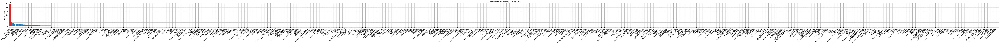

In [43]:
fig, ax = plt.subplots(figsize = (120, 3))

for count, (index, row) in enumerate(municsTotalCasesDeaths.iterrows()):
  if index != "São Paulo":
    ax.vlines(x = count, ymin = 0, ymax = row["casos"], linewidth = 10)
  else:
    ax.vlines(x = count, ymin = 0, ymax = row["casos"], linewidth = 10, color = "tab:red")

ax.set_title("Número total de casos por município")
ax.set_ylabel("Quantidade")
plt.xticks(range(municsTotalCasesDeaths.shape[0]), municsTotalCasesDeaths.index, rotation = 45, horizontalalignment = "right")
plt.xlim((-0.5, municsTotalCasesDeaths.shape[0] + 0.5))

plt.grid()

plt.savefig("./images/Número total de casos por município.png", bbox_inches = "tight")

plt.show()

In [44]:
municsTotalCasesDeaths = municsTotalCasesDeaths.sort_values("obitos", ascending = False)

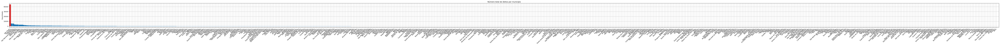

In [45]:
fig, ax = plt.subplots(figsize = (120, 3))

for count, (index, row) in enumerate(municsTotalCasesDeaths.iterrows()):
  if index != "São Paulo":
    ax.vlines(x = count, ymin = 0, ymax = row["obitos"], linewidth = 10)
  else:
    ax.vlines(x = count, ymin = 0, ymax = row["obitos"], linewidth = 10, color = "tab:red")

ax.set_title("Número total de óbitos por município")
ax.set_ylabel("Quantidade")
plt.xticks(range(municsTotalCasesDeaths.shape[0]), municsTotalCasesDeaths.index, rotation = 45, horizontalalignment = "right")
plt.xlim((-0.5, municsTotalCasesDeaths.shape[0] + 0.5))

plt.grid()

plt.savefig("./images/Número total de óbitos por município.png", bbox_inches = "tight")

plt.show()

Em termos absolutos, constata-se que São Paulo é preponderante tanto em casos, como em óbitos.

## Número total de casos e óbitos per capita e letalidade nos municípios

In [46]:
municsTotalCasesDeaths = municsTotalCasesDeaths.sort_values("casos_pc", ascending = False)

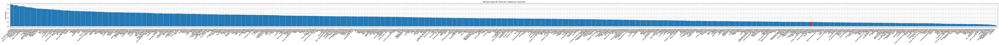

In [47]:
fig, ax = plt.subplots(figsize = (120, 3))

for count, (index, row) in enumerate(municsTotalCasesDeaths.iterrows()):
  if index != "São Paulo":
    ax.vlines(x = count, ymin = 0, ymax = row["casos_pc"], linewidth = 10)
  else:
    ax.vlines(x = count, ymin = 0, ymax = row["casos_pc"], linewidth = 10, color = "tab:red")

ax.set_title("Número total de casos per capita por município")
ax.set_ylabel("Quantidade")
plt.xticks(range(municsTotalCasesDeaths.shape[0]), municsTotalCasesDeaths.index, rotation = 45, horizontalalignment = "right")
plt.xlim((-0.5, municsTotalCasesDeaths.shape[0] + 0.5))

plt.grid()

plt.savefig("./images/Número total de casos per capita por município.png", bbox_inches = "tight")

plt.show()

In [48]:
municsTotalCasesDeaths = municsTotalCasesDeaths.sort_values("obitos_pc", ascending = False)

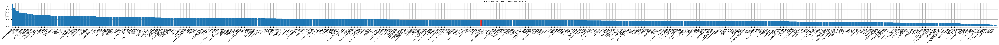

In [49]:
fig, ax = plt.subplots(figsize = (120, 3))

for count, (index, row) in enumerate(municsTotalCasesDeaths.iterrows()):
  if index != "São Paulo":
    ax.vlines(x = count, ymin = 0, ymax = row["obitos_pc"], linewidth = 10)
  else:
    ax.vlines(x = count, ymin = 0, ymax = row["obitos_pc"], linewidth = 10, color = "tab:red")

ax.set_title("Número total de óbitos per capita por município")
ax.set_ylabel("Quantidade")
plt.xticks(range(municsTotalCasesDeaths.shape[0]), municsTotalCasesDeaths.index, rotation = 45, horizontalalignment = "right")
plt.xlim((-0.5, municsTotalCasesDeaths.shape[0] + 0.5))

plt.grid()

plt.savefig("./images/Número total de óbitos per capita por município.png", bbox_inches = "tight")

plt.show()

Em termos per capita, constata-se que São Paulo não é mais tão preponderante.

In [50]:
municsTotalCasesDeaths["letalidade"] = municsTotalCasesDeaths["obitos"]/municsTotalCasesDeaths["casos"]
municsTotalCasesDeaths = municsTotalCasesDeaths.sort_values("letalidade", ascending = False)

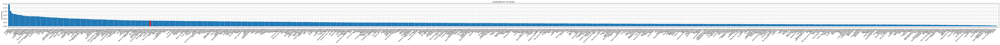

In [51]:
fig, ax = plt.subplots(figsize = (120, 3))

for count, (index, row) in enumerate(municsTotalCasesDeaths.iterrows()):
  if index != "São Paulo":
    ax.vlines(x = count, ymin = 0, ymax = row["letalidade"], linewidth = 10)
  else:
    ax.vlines(x = count, ymin = 0, ymax = row["letalidade"], linewidth = 10, color = "tab:red")

ax.set_title("Letalidade por município")
ax.set_ylabel("Quantidade")
plt.xticks(range(municsTotalCasesDeaths.shape[0]), municsTotalCasesDeaths.index, rotation = 45, horizontalalignment = "right")
plt.xlim((-0.5, municsTotalCasesDeaths.shape[0] + 0.5))

plt.grid()

plt.savefig("./images/Letalidade por município.png", bbox_inches = "tight")

plt.show()

## Número total de casos e óbitos nos municípios - População acima de 60 anos

In [52]:
dataMiCa60 = dataMiCa[dataMiCa["Idade"] > 60]
cases60 = dataMiCa60["Diagnostico_Covid19"][dataMiCa60["Diagnostico_Covid19"] == "CONFIRMADO"].count()
deaths60 = dataMiCa60["Obito"][dataMiCa60["Obito"] == "SIM"].count()

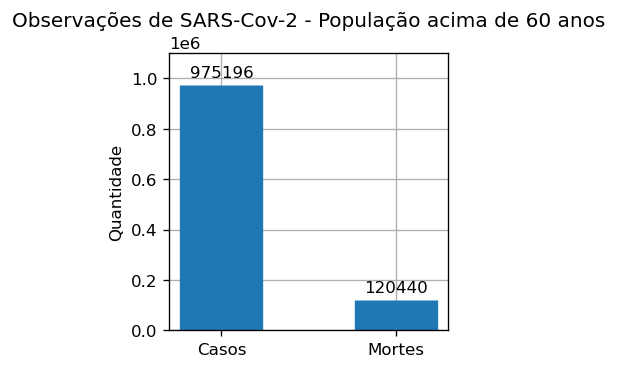

In [53]:
fig, ax = plt.subplots(figsize = (3, 3))

ax.vlines(x = 0, ymin = 0, ymax = cases60, linewidth = 50)
ax.vlines(x = 1, ymin = 0, ymax = deaths60, linewidth = 50)

ax.text(0, cases60 + 3e4, cases60, horizontalalignment = "center")
ax.text(1, deaths60 + 3e4, deaths60, horizontalalignment = "center")

ax.set_title("Observações de SARS-Cov-2 - População acima de 60 anos")

ax.set(ylim = (0, 1.1e6), xlim = (-0.3, 1.3))
ax.set_ylabel("Quantidade")
plt.xticks([0, 1], ["Casos", "Mortes"])

plt.grid()

plt.savefig("./images/Observações de SARS-Cov-2 - População acima de 60 anos.png", bbox_inches = "tight")

plt.show()

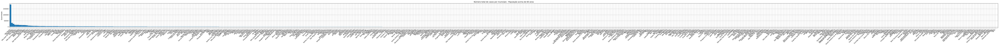

In [54]:
fig, ax = plt.subplots(figsize = (120, 3))

dataMiCa60MunicCount = dataMiCa60[dataMiCa60["Diagnostico_Covid19"] == "CONFIRMADO"]["Municipio"].value_counts()
for count, casos in enumerate(dataMiCa60MunicCount):
  ax.vlines(x = count, ymin = 0, ymax = casos, linewidth = 10)

ax.set_title("Número total de casos por município - População acima de 60 anos")
ax.set_ylabel("Quantidade")
plt.xticks(range(dataMiCa60MunicCount.shape[0]), [munic.title() for munic in dataMiCa60MunicCount.index], rotation = 45, horizontalalignment = "right")
plt.xlim((-0.5, dataMiCa60MunicCount.shape[0] + 0.5))

plt.grid()

plt.savefig("./images/Número total de casos por município - População acima de 60 anos.png", bbox_inches = "tight")

plt.show()

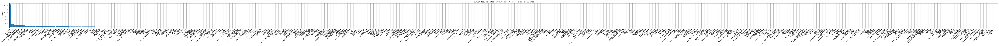

In [55]:
fig, ax = plt.subplots(figsize = (120, 3))

dataMiCa60MunicCount = dataMiCa60[dataMiCa60["Obito"] == "SIM"]["Municipio"].value_counts()
for count, obitos in enumerate(dataMiCa60MunicCount):
  ax.vlines(x = count, ymin = 0, ymax = obitos, linewidth = 10)

ax.set_title("Número total de óbitos por município - População acima de 60 anos")
ax.set_ylabel("Quantidade")
plt.xticks(range(dataMiCa60MunicCount.shape[0]), [munic.title() for munic in dataMiCa60MunicCount.index], rotation = 45, horizontalalignment = "right")
plt.xlim((-0.5, dataMiCa60MunicCount.shape[0] + 0.5))

plt.grid()

plt.savefig("./images/Número total de óbitos por município - População acima de 60 anos.png", bbox_inches = "tight")

plt.show()

c:\ProgramData\Miniconda3\envs\dataScience\Lib\site-packages\matplotlib\axes\_base.py:2503: UserWarning: Warning: converting a masked element to nan.
  xys = np.asarray(xys)


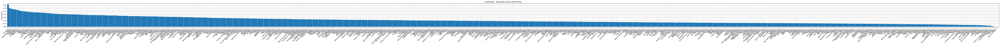

In [56]:
fig, ax = plt.subplots(figsize = (120, 3))

dataMiCa60MunicCount = dataMiCa60[dataMiCa60["Obito"] == "SIM"]["Municipio"].value_counts()/dataMiCa60[dataMiCa60["Diagnostico_Covid19"] == "CONFIRMADO"]["Municipio"].value_counts()
dataMiCa60MunicCount = dataMiCa60MunicCount.sort_values(ascending = False)
for count, obitos in enumerate(dataMiCa60MunicCount):
  ax.vlines(x = count, ymin = 0, ymax = obitos, linewidth = 10)

ax.set_title("Letalidade - População acima de 60 anos")
ax.set_ylabel("Quantidade")
plt.xticks(range(dataMiCa60MunicCount.shape[0]), [munic.title() for munic in dataMiCa60MunicCount.index], rotation = 45, horizontalalignment = "right")
plt.xlim((-0.5, dataMiCa60MunicCount.shape[0] + 0.5))

plt.grid()

plt.savefig("./images/Letalidade - População acima de 60 anos.png", bbox_inches = "tight")

plt.show()

## Número de casos e óbitos por gênero

In [57]:
dataMiCa.head(5)

,Asma,Cardiopatia,Data_Inicio_Sintomas,Diabetes,Diagnostico_Covid19,Doenca_Hematologica,Doenca_Hepatica,Doenca_Neurologica,Doenca Renal,Genero,Idade,Imunodepressao,Municipio,Obesidade,Obito,Outros_Fatores_De_Risco,Pneumopatia,Puérpera,Síndrome_De_Down
0,NaN,NaN,2022-07-15,NaN,CONFIRMADO,NaN,NaN,NaN,NaN,MASCULINO,69.0,NaN,ASSIS,NaN,NÃO,NaN,NaN,NaN,NaN
1,NaN,NaN,2021-02-21,NaN,CONFIRMADO,NaN,NaN,NaN,NaN,FEMININO,60.0,NaN,SÃO PAULO,NaN,NÃO,NaN,NaN,NaN,NaN
2,NaN,NaN,2021-06-23,NaN,CONFIRMADO,NaN,NaN,NaN,NaN,MASCULINO,58.0,NaN,ARARAQUARA,NaN,NÃO,NaN,NaN,NaN,NaN
3,NaN,NaN,2021-02-03,NaN,CONFIRMADO,NaN,NaN,NaN,NaN,FEMININO,45.0,NaN,SÃO PAULO,NaN,NÃO,NaN,NaN,NaN,NaN
4,NaN,NaN,2021-02-23,NaN,CONFIRMADO,NaN,NaN,NaN,NaN,FEMININO,42.0,NaN,SÃO PAULO,NaN,NÃO,NaN,NaN,NaN,NaN


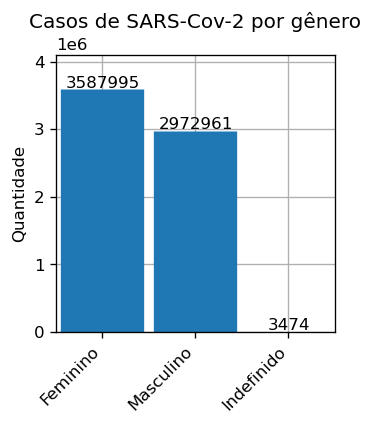

In [58]:
fig, ax = plt.subplots(figsize = (3, 3))

dataMiCaGenCount = dataMiCa["Genero"][dataMiCa["Diagnostico_Covid19"] == "CONFIRMADO"].value_counts()
for count, casos in enumerate(dataMiCaGenCount):
  ax.vlines(x = count, ymin = 0, ymax = casos, linewidth = 50)
  ax.text(count, casos + 3e4, casos, horizontalalignment = "center")

ax.set_title("Casos de SARS-Cov-2 por gênero")

ax.set(ylim = (0, 4.1e6), xlim = (-0.5, 2.5))
ax.set_ylabel("Quantidade")
plt.xticks(range(dataMiCaGenCount.shape[0]), [gen.title() for gen in dataMiCaGenCount.index], rotation = 45, horizontalalignment = "right")

plt.grid()

plt.savefig("./images/Casos de SARS-Cov-2 por gênero.png", bbox_inches = "tight")

plt.show()

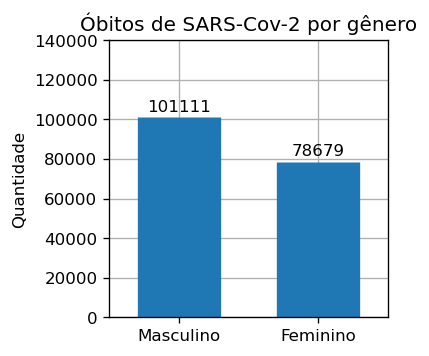

In [59]:
fig, ax = plt.subplots(figsize = (3, 3))

dataMiCaGenCount = dataMiCa["Genero"][dataMiCa["Obito"] == "SIM"].value_counts()
for count, obitos in enumerate(dataMiCaGenCount):
  ax.vlines(x = count, ymin = 0, ymax = obitos, linewidth = 50)
  ax.text(count, obitos + 3e3, obitos, horizontalalignment = "center")

ax.set_title("Óbitos de SARS-Cov-2 por gênero")

ax.set(ylim = (0, 1.4e5), xlim = (-0.5, 1.5))
ax.set_ylabel("Quantidade")
plt.xticks(range(dataMiCaGenCount.shape[0]), [gen.title() for gen in dataMiCaGenCount.index])

plt.grid()

plt.savefig("./images/Óbitos de SARS-Cov-2 por gênero.png", bbox_inches = "tight")

plt.show()

## Número de casos e óbitos por faixa etária

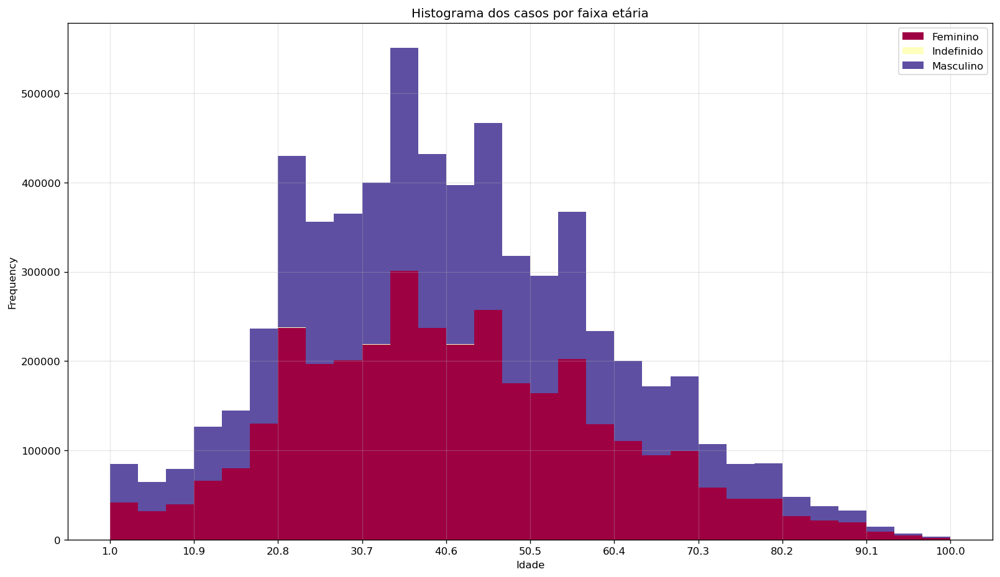

In [60]:
df = dataMiCa[dataMiCa["Diagnostico_Covid19"] == "CONFIRMADO"]
x_var = "Idade"
groupby_var = "Genero"
dataMiCa_agg = df.loc[:, [x_var, groupby_var]].groupby(groupby_var)
vals = [df[x_var].values.tolist() for i, df in dataMiCa_agg]

plt.figure(figsize = (16, 9))
colors = [plt.cm.Spectral(i/float(len(vals) - 1)) for i in range(len(vals))]
n, bins, patches = plt.hist(vals, 30, stacked = True, density = False, color = colors[:len(vals)])

plt.legend({group:col for group, col in zip([gen.title() for gen in sorted(df[groupby_var].dropna().unique())], colors[:len(vals)])})
plt.title("Histograma dos casos por faixa etária")
plt.xlabel(x_var)
plt.ylabel("Frequency")
plt.grid(alpha = 0.3)
plt.xticks(ticks = bins[::3], labels = [round(b, 1) for b in bins[::3]])

plt.savefig("./images/Histograma empilhado dos casos por faixa etária.png", bbox_inches = "tight")

plt.show()

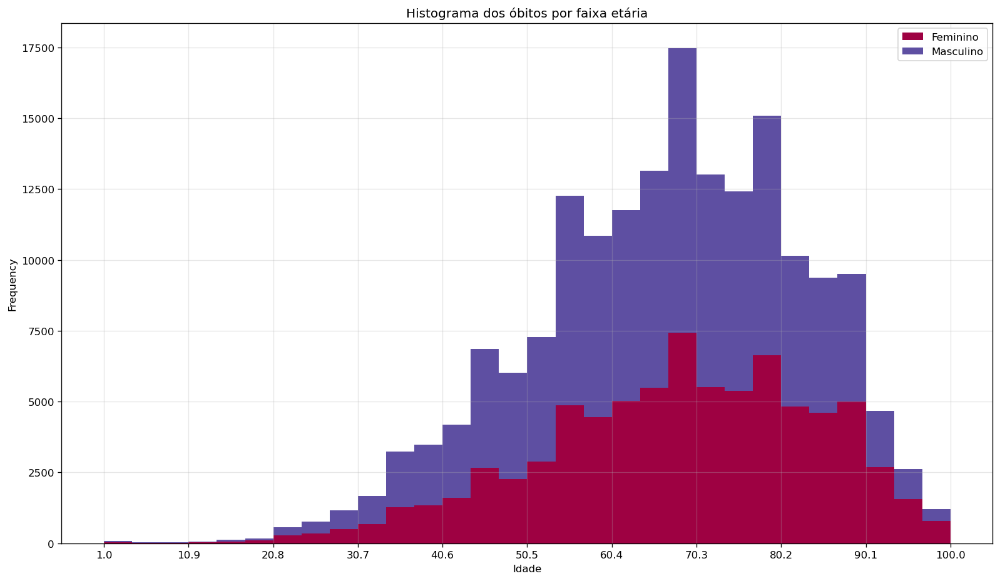

In [61]:
df = dataMiCa[dataMiCa["Obito"] == "SIM"]
x_var = "Idade"
groupby_var = "Genero"
dataMiCa_agg = df.loc[:, [x_var, groupby_var]].groupby(groupby_var)
vals = [df[x_var].values.tolist() for i, df in dataMiCa_agg]

plt.figure(figsize = (16, 9))
colors = [plt.cm.Spectral(i/float(len(vals) - 1)) for i in range(len(vals))]
n, bins, patches = plt.hist(vals, 30, stacked = True, density = False, color = colors[:len(vals)])

plt.legend({group:col for group, col in zip([gen.title() for gen in sorted(df[groupby_var].dropna().unique())], colors[:len(vals)])})
plt.title("Histograma dos óbitos por faixa etária")
plt.xlabel(x_var)
plt.ylabel("Frequency")
plt.grid(alpha = 0.3)
plt.xticks(ticks = bins[::3], labels = [round(b, 1) for b in bins[::3]])

plt.savefig("./images/Histograma empilhado dos óbitos por faixa etária.png", bbox_inches = "tight")

plt.show()

## Determine o número de casos e  óbitos por doença preexistente

In [62]:
diseases = ["Asma", "Cardiopatia", "Diabetes", "Doenca_Hematologica", "Doenca_Hepatica", "Doenca_Neurologica", "Doenca Renal", "Imunodepressao", "Obesidade", "Outros_Fatores_De_Risco", "Pneumopatia", "Puérpera", "Síndrome_De_Down"]

In [63]:
disCountCases = dict()

dataMiCaCases = dataMiCa[dataMiCa["Diagnostico_Covid19"] == "CONFIRMADO"]
for dis in diseases:
  disCountCases[dis] = dataMiCaCases[dis].value_counts()

disCountCases = pd.DataFrame(disCountCases).T

In [64]:
disCountCases

,NÃO,SIM
Asma,215352,15982
Cardiopatia,100124,463934
Diabetes,140553,308626
Doenca_Hematologica,223313,4457
Doenca_Hepatica,222345,4651
Doenca_Neurologica,210814,23535
Doenca Renal,212338,31665
Imunodepressao,215896,38231
Obesidade,189832,48469
Outros_Fatores_De_Risco,125683,151353


In [65]:
disCountDeaths = dict()

dataMiCaDeaths = dataMiCa[dataMiCa["Obito"] == "SIM"]
for dis in diseases:
  disCountDeaths[dis] = dataMiCaDeaths[dis].value_counts()

disCountDeaths = pd.DataFrame(disCountDeaths).T

In [66]:
disCountDeaths

,NÃO,SIM
Asma,78605,3899
Cardiopatia,32747,76026
Diabetes,47800,53990
Doenca_Hematologica,80449,1763
Doenca_Hepatica,79862,2207
Doenca_Neurologica,74147,11054
Doenca Renal,74687,10187
Imunodepressao,77306,6146
Obesidade,68337,17276
Outros_Fatores_De_Risco,44555,54711


# Avaliação do estado atual da pandemia de SARS-Cov-2 no Estado de São Paulo

Ao avaliar todos os gráficos gerados, disponíveis em alta resolução no diretório [`images`](https://github.com/willfliaw/PME3573/tree/main/E01/images), pode-se ter uma noção geral do estado atual da pandemia de SARS-Cov-2 no Estado de São Paulo, semelhante àquela oriunda de [Coronavírus - Dados Completos](https://www.seade.gov.br/coronavirus/).

Dentre as possíveis constatações decorrentes da análise dos gráficos e tabelas, tem-se as seguintes evidências:

- Observou-se um número cerca de 37 vezes maior de casos de contração de SARS-Cov-2 do que de óbitos pela doença;
  - Tem-se 3% de letalidade no Estado de São Paulo;
- Não se identificam picos ou surtos apreciavelmente acentuados na evolução dos casos e óbitos no Estado de São Paulo, desde o início da pandemia;
  - Os gráficos de média móvel são muito semelhantes às visualizações sem tal função estatística, na ordem de grandeza do número de casos/óbitos;
- Tem-se um crescimento reduzido do número de casos e de óbitos no Estado de São Paulo após setembro de 2021;
- Em termos absolutos, observa-se que o município de São Paulo é preponderante hoje e foi preponderante desde o início da pandemia, em questão de casos e óbitos de SARS-Cov-2;
  - Em termos per capita, observa-se que o município de São Paulo não é preponderante em relação aos demais municípios;
- Em termos per capita, observa-se que o município de São Paulo *não é* preponderante em relação aos demais municípios, mas sim outros municípios menos populosos;
- A maior letalidade observada é de cerca de 15%, no município de Sarutaiá;
  - A maior letalidade aumenta para cerca de 35% para a população acima de 60 anos, também em Sarutaiá;
- Ainda que se tenha mais casos para o gênero Feminino, tem-se mais óbitos para o gênero masculino;
- A população de 20 a 60 anos é mais numerosa em quantidade de casos de contração de SARS-Cov-2;
- A população de 55 a 90 anos é mais numerosa em quantidade de óbitos por SARS-Cov-2;
- O comportamento para ambos os gêneros é semelhante ao longo das diversas faixas etárias;
- Verifica-se evidências de que aqueles com cardiopatia e diabetes estão mais propensos a contrair e a morrer por SARS-Cov-2.